# Лабораторная работа №n

Набор данных: ссылка

## Задание



## Контрольные вопросы



## Теория

Облако точек - это самый простой способ представления различных объектов в виде неупорядоченного набора точек в трехмерной плоскости. Такие данные можно получить с помощью сканирования предметов или их структуры с помощью 3D-датчиков, например LiDAR. Качественные облака точек с высокой точностью измерения позволяют представить цифровую версию реального мира.

<figure>
<center>
<img src='https://www.codeproject.com/KB/openGL/839389/bunny_points.PNG' />
<figcaption>Стэндфордский кролик</figcaption></center>
</figure>

Как правило, при глубоком обучении трехмерного облака точек необходимо решить две задачи: классификацию и сегментацию.
Основная проблема работы с облаком точек заключается в том, что типичная сверточная архитектура требует упорядоченный формат входных данных (например, изображение). Поскольку облако точек не является таким, общепринятые подходы заключаются в преобразовании данных в обычную 3D-воксельную сетку или проекцию.

В данной лабораторной работе используется эффективный подход для сегментации - DBSCAN.

DBSCAN (кластеризация на основе плотности) - плотностной алгоритм пространственной кластеризации с присутствием шума. Он определяет кластер произвольной формы в пространстве как максимальный набор точек, связанных достаточно высокой плотностью. Каждый объект, не содержащийся ни в одном кластере, автоматически считается шумом. Этот метод чувствителен к таким параметрам, как эпсилон (eps) и количество образцов в окрестностях для точки, которую следует рассматривать как основную точку (min_pts).

<figure>
<center>
<img src='https://www.researchgate.net/publication/342871651/figure/fig3/AS:912165510840320@1594488613526/The-graphical-representation-of-the-key-components-of-the-DBSCAN-algorithm-a-a.png' />
<figcaption>Работа алгоритма DBSCAN: (a) кластер, (b) основная точка (синяя точка), (c) пограничная точка (желтая точка), (d) точки, доступные для области</figcaption></center>
</figure>

DBSCAN выполняет итерацию по случайным точкам в наборе данных. Для каждой рассматриваемой точки он вычисляет окрестности этой точки, и если эта окрестность содержит более определенного количества точек, она включается в область. Каждая соседняя точка проходит через один и тот же процесс до тех пор, пока она больше не сможет расширять кластер. Если рассматриваемая точка не является внутренней точкой, т.е. у нее недостаточно соседей, она будет помечена как шум. Это позволяет DBSCAN быть устойчивым к выбросам.

## Импорт библиотек

In [1]:
#pip install

In [1]:
import numpy as np
import math
import pandas as pd
import seaborn as sns
import h5py
import os
import glob
import open3d as o3d
from sklearn.cluster import DBSCAN, OPTICS
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from kneed import KneeLocator
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from itertools import product
from random import randrange
from sklearn.metrics import silhouette_score

Метки (labels) варьируются от -1 до n, где -1 указывает, что это точка с "шумом", а значения от 0 до n - это метки кластера, присвоенные соответствующей точке. Для удобства каждой точке определенной метки присваивается свой цвет.

max_label сохраняет максимальное значение в списке меток. Для зашумленных точек со значением метки "-1" позже присваивается значение черного цвета (black).

In [2]:
def segment_pcd_old(X, pcd, points, user_eps, user_min_samp):
    clustering = DBSCAN(eps=user_eps, min_samples=user_min_samp, algorithm='ball_tree').fit(X)

    labels=clustering.labels_

    max_label = labels.max() + 1

    obj_points=[]
    for i in range(max_label):
        idx_labels = np.where(labels==i)
        obj_points.append(points[idx_labels])

    idx_layer=np.where(labels<0)
    colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
    colors[labels < 0] = 0
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    return pcd, colors, max_label, obj_points

In [3]:
# функция для сегментации
def segment_pcd(X, pcd, points, user_eps, user_min_samp, max_clusters, handle_noises):
    clustering = DBSCAN(eps=user_eps, min_samples=user_min_samp, algorithm='ball_tree').fit(X)

    labels=clustering.labels_

    max_label = labels.max() + 1
    
    #--------------------------------------------

    unique_labels, counts = np.unique(labels, axis=0, return_counts=True)
    dic = dict(zip(unique_labels, counts))
#     print(dic)

    num_of_points = min(counts[1:max_clusters+1])
    indexes_of_max = []
    for i in range(max_clusters):
        for j in range(num_of_points):
            indexes_of_max.append(np.where(labels==i)[0][-j])
            
    if(max_label >= max_clusters):
        min_dist = 1000
        for i in range(max_clusters, max_label): # обработка неудавшихся кластеров
            index = np.where(labels==i)
            index = index[len(index)//2][len(index)//2]
            for k in range(max_clusters):
                for j in range(num_of_points):
                    dist = math.dist(X[index], X[indexes_of_max[j+k*num_of_points]])
                    if (dist <= min_dist):
                        min_dist = dist
                        min_dist_label = k
            labels[labels==i] = min_dist_label

    if(handle_noises):
        for i in range(counts[0]): # обработка шумов # тут наверное надо поменять чтоб оно учитывала обработку мелких
            index = np.where(labels==-1)[0][0]
            min_dist = 1000
            for k in range(max_clusters):
                dist = math.dist(X[index], X[indexes_of_max[k*num_of_points+num_of_points-1]])
                if (dist <= min_dist):
                    min_dist = dist
                    min_dist_index = k
            labels[index] = min_dist_index
    
    #--------------------------------------------
    
    obj_points=[]
    for i in range(max_label):
        idx_labels = np.where(labels==i)
        obj_points.append(points[idx_labels])

    idx_layer=np.where(labels<0)
    colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
    colors[labels < 0] = 0
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    return pcd, colors, max_label, obj_points

In [4]:
# функция для графического отображения облака точек
def draw_plot(points, colors=None):
  fig = go.Figure(
      data=[
          go.Scatter3d(
              x=points[:,0], y=points[:,1], z=points[:,2], 
              mode='markers',
              marker=dict(size=1, color=colors)
          )
      ],
      layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
      )
      )
  return fig

In [5]:
# функция присваивания цвета точке
def add_color(pcd, colors):
  if pcd.has_colors():
    colors = np.asarray(pcd.colors)
  elif pcd.has_normals():
    colors = (0.0, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5
  else:
    pcd.paint_uniform_color((0.0, 0.0, 0.0))
    colors = np.asarray(pcd.colors)
  return pcd, colors

In [6]:
# функция для представления точек в pcd
def np_to_pcd(points):
  colors = np.zeros(points.shape)
  for i in range(0,points.shape[0]):
    colors[i][0] = 0.12156863
    colors[i][1] = 0.46666667
    colors[i][2] = 0.70588235
  point_cloud = o3d.geometry.PointCloud()
  point_cloud.points = o3d.utility.Vector3dVector(points)
  point_cloud.colors = o3d.utility.Vector3dVector(colors)
  return point_cloud

## Загрузка набора данных

In [7]:
pcd = o3d.io.read_point_cloud("./example.pcd")
points = np.asarray(pcd.points)
colors = None

In [8]:
# draw_plot(points, colors)

Если помимо деревьев в обаке точек присутсвует земля, то для лучшего результата сегментации ее нужно убрать. Код, представленный ниже, удаляет ее с помощью вычисления нормали (функция estimate_normals) на основе метода k-ближайших соседей.

In [9]:
# #удаление земли из облака точек
# idx_all = np.empty((points.shape[0],1), dtype = int)
# for i in range(points.shape[0]):
#   idx_all[i][0] = i
# pointsres = points

# pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))
# normals = np.asarray(pcd.normals)

# idx_normals=np.where((abs(normals[:,2])<0.05))
# idx_ground=np.where(points[:,2]>np.min(points[:,2]+5))
# idx_wronglyfiltered=np.setdiff1d(idx_ground, idx_normals)
# idx_retained=np.append(idx_normals, idx_wronglyfiltered)
# points = points[idx_retained]
# idx_retained = np.asarray(idx_retained)
# idx_retained = np.transpose(idx_retained)
          
# idx_inv=np.setdiff1d(idx_all, idx_retained)
# points_ground = pointsres[idx_inv]
# point_cloud_ground = np_to_pcd(points_ground)
          
# point_cloud = np_to_pcd(points)

# colors_ground = np.zeros(points_ground.shape)
# for i in range(0,points_ground.shape[0]):
#   colors_ground[i][0] = 1
#   colors_ground[i][1] = 0.2
#   colors_ground[i][2] = 0.2

# point_cloud_ground.colors = o3d.utility.Vector3dVector(colors_ground)
# pcd = point_cloud

In [10]:
# pcd, colors = add_color(pcd, colors)
# X = np.asarray(pcd.points)

In [11]:
# настройка основных параметров модели
# eps - размер окрестности точки
# min_pts - минимальное кол-во точек в окрестности

# eps = 0.78
# min_pts = 135

In [12]:
# max_label, obj_points = None, None
# new_pcd, colors, max_label, obj_points = segment_pcd(X, pcd, points, eps, min_pts)
# print(f"Распознано {max_label} объектов в облаке точек")

In [13]:
# points = np.asarray(pcd.points)
# new_pcd, colors = add_color(new_pcd, colors)

# draw_plot(points, colors)

In [14]:
h5f = h5py.File(("./segmentation-dataset.h5"),'r')
df = h5f.get('dataset_a')[:]
h5f.close()

In [15]:
points = np.asarray(df[2])
pcd = np_to_pcd(points)
colors = None

In [16]:
draw_plot(points, colors)

In [17]:
eps = 0.5
min_pts = 240

eps = 0.1697
min_pts = 18

pcd, colors = add_color(pcd, colors)
X = np.asarray(pcd.points)
max_label, obj_points = None, None

new_pcd, colors, max_label, obj_points = segment_pcd_old(X, pcd, points, eps, min_pts)
print(f"Распознано {max_label} объектов в облаке точек")

Распознано 18 объектов в облаке точек


In [18]:
points = np.asarray(pcd.points)
new_pcd, colors = add_color(new_pcd, colors)

draw_plot(points, colors)

In [19]:
# настройка основных параметров модели
# eps - размер окрестности точки
# min_pts - минимальное кол-во точек в окрестности

eps = 0.1697
min_pts = 18
n_clusters = 4

# eps = 0.5
# min_pts = 240

In [20]:
pcd, colors = add_color(pcd, colors)
X = np.asarray(pcd.points)
max_label, obj_points = None, None

new_pcd, colors, max_label, obj_points = segment_pcd(X, pcd, points, eps, min_pts, n_clusters, True)
print(f"Распознано {max_label} объектов в облаке точек")

Распознано 18 объектов в облаке точек


In [21]:
points = np.asarray(pcd.points)
new_pcd, colors = add_color(new_pcd, colors)

draw_plot(points, colors)

In [22]:
from sklearn.neighbors import NearestNeighbors

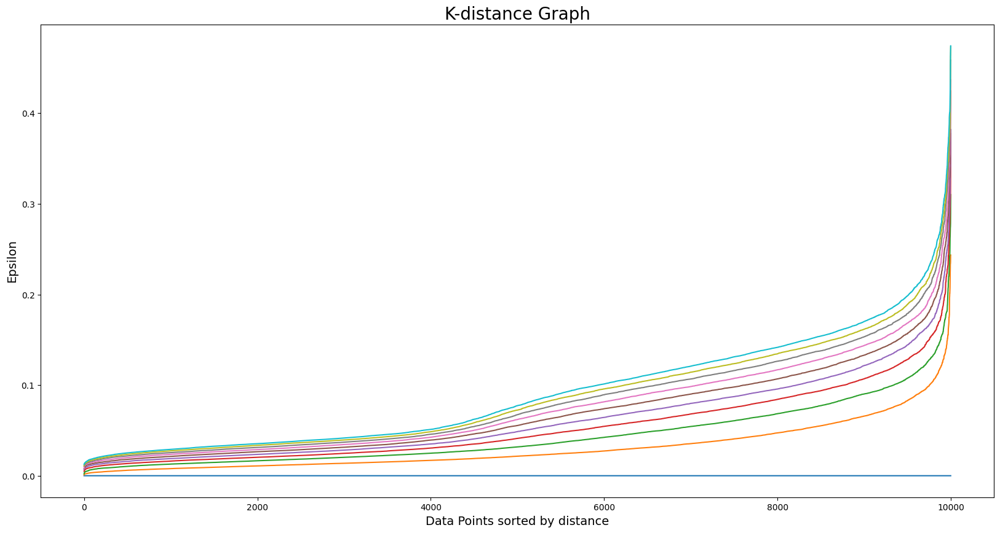

In [24]:
neigh = NearestNeighbors(n_neighbors = 10)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

# Отобразим график расстояний между точками
distances = np.sort(distances, axis = 0)
distances = distances[:]
plt.figure(figsize = (20, 10))
plt.plot(distances)
plt.title('K-distance Graph', fontsize = 20)
plt.xlabel('Data Points sorted by distance', fontsize = 14)
plt.ylabel('Epsilon', fontsize = 14)
plt.show()

0.16971813707940117


<Figure size 2000x1000 with 0 Axes>

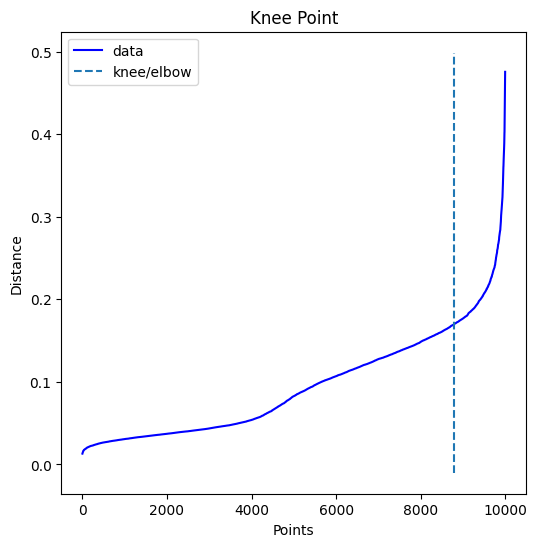

In [25]:
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)
distances = np.sort(distances[:,10], axis=0)

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(20, 10))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [26]:
%%time
pca_eps_values = [0.1697]
pca_min_samples = np.arange(10,30,1) 

pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1], algorithm='ball_tree').fit(X)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_))-1)
    pca_sil_score.append(silhouette_score(X, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters, pca_epsvalues, pca_min_samp, pca_sil_score))
pca_eps_min_df_re = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'epsilon_values', 'minimum_points', 'silhouette score'])
pca_eps_min_df_re

CPU times: total: 43.9 s
Wall time: 30.1 s


,no_of_clusters,epsilon_values,minimum_points,silhouette score
0,10,0.1697,10,-0.251448
1,8,0.1697,11,-0.209132
2,10,0.1697,12,-0.233266
3,8,0.1697,13,-0.075334
4,13,0.1697,14,-0.206210
5,16,0.1697,15,-0.183069
6,16,0.1697,16,-0.145269
7,15,0.1697,17,-0.002945
8,18,0.1697,18,-0.006624
9,21,0.1697,19,-0.049863


In [27]:
pca_dbscan_cl = DBSCAN(eps=0.5, min_samples=240, algorithm='ball_tree').fit(X)
print(silhouette_score(X, pca_dbscan_cl.labels_))

0.2283195515012881


In [28]:
clustering = DBSCAN(eps=0.1697, min_samples=17, algorithm='ball_tree').fit(X)

labels=clustering.labels_
  
max_label = labels.max() + 1


unique_labels, counts = np.unique(labels, axis=0, return_counts=True)
dic = dict(zip(unique_labels, counts))
print(dic)

# max_labels = unique_labels[-4:]
num_of_points = 3
indexes_of_max = []

num_of_points = min(counts[1:4+1])
print(num_of_points)

for i in range(4):
    for j in range(num_of_points):
        indexes_of_max.append(np.where(labels==i)[0][-j])
print(indexes_of_max)


min_dist_index_list = []

for i in range(4, max_label):
    index = np.where(labels==i)[0][0]
    print(i, ": ", index)
    for j in range(num_of_points):
        min_dist = 1000
        for k in range(4):
            dist = math.dist(X[index], X[indexes_of_max[j+k*num_of_points]])
            if (dist <= min_dist):
                min_dist = dist
                min_dist_index = k
        min_dist_index_list.append(min_dist_index)
    labels[labels==i] = max(set(min_dist_index_list), key=min_dist_index_list.count)

print(np.where(labels==-1)[0][571])
# max_labels[0]

# labels[labels.argmax()]

# obj_points=[]
# for i in range(max_label):
# idx_labels = np.where(labels==i)
# obj_points.append(points[idx_labels])

# idx_layer=np.where(labels<0)
# colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
# colors[labels < 0] = 0
# pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

  #return pcd, colors, max_label, obj_points

{-1: 1038, 0: 1924, 1: 2388, 2: 2058, 3: 1444, 4: 32, 5: 345, 6: 95, 7: 202, 8: 125, 9: 211, 10: 62, 11: 27, 12: 14, 13: 19, 14: 16}
1444
[1, 9996, 9974, 9966, 9963, 9958, 9950, 9944, 9941, 9937, 9935, 9928, 9926, 9925, 9923, 9914, 9912, 9906, 9904, 9903, 9901, 9900, 9880, 9876, 9874, 9873, 9870, 9868, 9866, 9864, 9844, 9843, 9837, 9832, 9813, 9812, 9801, 9795, 9792, 9782, 9778, 9770, 9768, 9760, 9757, 9755, 9741, 9737, 9735, 9719, 9717, 9713, 9712, 9710, 9707, 9701, 9700, 9693, 9685, 9677, 9675, 9674, 9673, 9670, 9663, 9661, 9653, 9647, 9642, 9640, 9635, 9629, 9625, 9615, 9601, 9599, 9598, 9590, 9587, 9583, 9572, 9570, 9565, 9530, 9527, 9519, 9504, 9501, 9495, 9485, 9476, 9469, 9466, 9464, 9459, 9454, 9451, 9448, 9441, 9439, 9438, 9436, 9432, 9426, 9423, 9421, 9419, 9400, 9398, 9396, 9386, 9381, 9372, 9371, 9366, 9365, 9363, 9361, 9349, 9341, 9339, 9329, 9328, 9320, 9314, 9306, 9302, 9295, 9292, 9289, 9286, 9285, 9282, 9280, 9277, 9270, 9262, 9258, 9257, 9254, 9251, 9248, 9241, 9234, 

# Вокселизация

In [56]:
def draw_voxel_plot(grid):
    x_arr = []
    y_arr = []
    z_arr = []
    g = grid.get_voxels()
    colors_arr = []
    for i in range(len(g)):
        x_arr.append(g[i].grid_index[0])
        y_arr.append(g[i].grid_index[1])
        z_arr.append(g[i].grid_index[2])
        colors_arr.append(g[i].color)
    
    fig = go.Figure(
        data=[
          go.Scatter3d(
              x=x_arr, y=y_arr, z=z_arr, 
              mode='markers',
              marker=dict(size=5, color=colors_arr)
          )
        ],
        layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
        )
        )
    return fig

In [57]:
N = len(points)
vsize=0.1
pcd2 = pcd
pcd2.scale(1 / np.max(pcd2.get_max_bound() - pcd2.get_min_bound()),
          center=pcd2.get_center())
pcd2.colors = o3d.utility.Vector3dVector(np.random.uniform(0, 1, size=(N, 3)))
# o3d.visualization.draw_geometries([pcd])

voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcd2,vsize)
# o3d.visualization.draw_geometries([voxel_grid], point_show_normal=True)
print(voxel_grid)

VoxelGrid with 239 voxels.


In [58]:
voxel_points = []
voxel_len = len(voxel_grid.get_voxels())
for i in range(voxel_len):
    voxel_points.append([voxel_grid.get_voxels()[i].grid_index[0],
                         voxel_grid.get_voxels()[i].grid_index[1],
                         voxel_grid.get_voxels()[i].grid_index[2]])
    if voxel_grid.get_voxels()[i].grid_index[2] == 0:
        print(voxel_grid.get_voxels()[i].grid_index)

[4 3 0]
[7 8 0]
[9 5 0]
[5 3 0]
[3 6 0]
[8 8 0]


In [59]:
draw_voxel_plot(voxel_grid)

In [60]:
def draw_voxel_plot_w(W, max_w):
    x_arr = []
    y_arr = []
    z_arr = []
    colors_arr = []
    for x, y, z in product(range(W.shape[0]), range(W.shape[1]), range(W.shape[2])):
        if(W[x, y, z] != 0):
            x_arr.append(x)
            y_arr.append(y)
            z_arr.append(z)
            colors_arr.append((0,0.7,0,5*W[x,y,z]/max_w))
    
    fig = go.Figure(
        data=[
          go.Scatter3d(
              x=x_arr, y=y_arr, z=z_arr, 
              mode='markers',
              marker=dict(size=5, color=colors_arr)
          )
        ],
        layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
        )
        )
    return fig

In [61]:
def draw_plot_w(W, max_w, voxel_dots):
    x_arr = []
    y_arr = []
    z_arr = []
    colors_arr = []
    for x, y, z in product(range(W.shape[0]), range(W.shape[1]), range(W.shape[2])):
        if(W[x, y, z] != 0):
            for dot in voxel_dots[x][y][z]:
                x_arr.append(dot[0])
                y_arr.append(dot[1])
                z_arr.append(dot[2])
                colors_arr.append((4*W[x,y,z]/max_w, 0.7, 0, 1))
            
    
    fig = go.Figure(
        data=[
          go.Scatter3d(
              x=x_arr, y=y_arr, z=z_arr, 
              mode='markers',
              marker=dict(size=5, color=colors_arr)
          )
        ],
        layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
        )
        )
    return fig

In [62]:
def get_voxels_w(points):
    # Calculate voxel cloud boundaries
    cloud_start = [points[0][0], points[0][1], points[0][1]]
    cloud_end = [points[0][0], points[0][1], points[0][1]]
    for point in points:
        for i in range(3):
            if(cloud_start[i] > point[i]): cloud_start[i] = point[i]
            if(cloud_end[i] < point[i]): cloud_end[i] = point[i]
            
    # Set resolution for each axis
    res = [math.ceil((cloud_end[0] - cloud_start[0]) / vsize),
           math.ceil((cloud_end[1] - cloud_start[1]) / vsize),
           math.ceil((cloud_end[2] - cloud_start[2]) / vsize)]
    
    W = np.zeros((res[0],res[1],res[2]), dtype=int) # Weight(number of points) of each voxel
    voxel_dots = [[[[] for k in range(res[2])] for j in range(res[1])] for i in range(res[0])] # Array of coordinates of each point of each voxel
    max_w = 0 # Maximal weight of a voxel
    coord = [-1,-1,-1] 
    for point in pcd2.points:
        # Calculate an appropriate voxel for each point
        for i in range(0, 3):
            coord[i] = int((-cloud_start[i] + point[i])//vsize)
        W[coord[0], coord[1], coord[2]] += 1
        voxel_dots[coord[0]][coord[1]][coord[2]].append(point)
        if(W[coord[0], coord[1], coord[2]] > max_w):
            max_w = W[coord[0], coord[1], coord[2]]
    return (W, max_w, voxel_dots)

W, max_w, voxel_dots = get_voxels_w(pcd2.points)
draw_plot_w(W, max_w, voxel_dots)

In [63]:
class VoxelCloud:
    def __init__(self, points, vsize):
        self.points = points
        self.vsize = vsize
        # Calculate voxel cloud boundaries
        cloud_start = [points[0][0], points[0][1], points[0][1]]
        cloud_end = [points[0][0], points[0][1], points[0][1]]
        for point in points:
            for i in range(3):
                if(cloud_start[i] > point[i]): cloud_start[i] = point[i]
                if(cloud_end[i] < point[i]): cloud_end[i] = point[i]

        # Set resolution for each axis
        res = [math.ceil((cloud_end[0] - cloud_start[0]) / vsize),
               math.ceil((cloud_end[1] - cloud_start[1]) / vsize),
               math.ceil((cloud_end[2] - cloud_start[2]) / vsize)]

        self.W = np.zeros((res[0],res[1],res[2]), dtype=int) # Weight(number of points) of each voxel
        self.colors = np.ndarray((res[0],res[1],res[2]), dtype='U7') # Color of each voxel
        self.voxel_dots = [[[[] for k in range(res[2])] for j in range(res[1])] for i in range(res[0])] # Array of coordinates of each point of each voxel
        self.voxels = [] # Array of coordinates of non-empty voxels
        coord = [-1,-1,-1] 
        for point in pcd2.points:
            # Calculate an appropriate voxel for each point
            for i in range(0, 3):
                coord[i] = int((-cloud_start[i] + point[i])//vsize)
            # Add to self.voxels when number of points becomes more than 0
            if(self.W[coord[0], coord[1], coord[2]] == 0):
                self.voxels.append((coord[0], coord[1], coord[2]))
                self.colors[coord[0], coord[1], coord[2]] = '#000000'
            # Each point increases weight of the containing voxel
            self.W[coord[0], coord[1], coord[2]] += 1
            # Add point to the list of contained points of the voxel
            self.voxel_dots[coord[0]][coord[1]][coord[2]].append(point)
            
    def set_voxel_color(self, voxel, color):
        self.colors[voxel[0], voxel[1], voxel[2]] = color
        
    def set_voxel_colors(self, colors):
        for i in range(len(colors)):
            x, y, z = self.voxels[i]
            self.colors[x, y, z] = colors[i]

    def get_voxel_fig(self):
        x_arr = []
        y_arr = []
        z_arr = []
        colors_arr = []
        for x, y, z in self.voxels:
            x_arr.append(x)
            y_arr.append(y)
            z_arr.append(z)
            colors_arr.append(self.colors[x, y, z])

        fig = go.Figure(
            data=[
              go.Scatter3d(
                  x=x_arr, y=y_arr, z=z_arr, 
                  mode='markers',
                  marker=dict(size=5, color=colors_arr)
              )
            ],
            layout=dict(
              scene=dict(
                  xaxis=dict(visible=False),
                  yaxis=dict(visible=False),
                  zaxis=dict(visible=False)
              )
            )
            )
        return fig
    
    def get_fig(self):
        x_arr = []
        y_arr = []
        z_arr = []
        colors_arr = []
        for vx, vy, vz in self.voxels:
            #print(self.voxel_dots[vx][vy][vz])
            for x, y, z in self.voxel_dots[vx][vy][vz]:
                x_arr.append(x)
                y_arr.append(y)
                z_arr.append(z)
                colors_arr.append(self.colors[vx, vy, vz])

        fig = go.Figure(
            data=[
              go.Scatter3d(
                  x=x_arr, y=y_arr, z=z_arr, 
                  mode='markers',
                  marker=dict(size=5, color=colors_arr)
              )
            ],
            layout=dict(
              scene=dict(
                  xaxis=dict(visible=False),
                  yaxis=dict(visible=False),
                  zaxis=dict(visible=False)
              )
            )
            )
        return fig

In [64]:
%%time
import networkx as nx
from scipy.spatial.distance import pdist, squareform

vsize = 0.1
voxel_cloud = VoxelCloud(pcd2.points, vsize)
voxel_len = len(voxel_cloud.voxels)

# Создаем матрицу расстояний между всеми парами точек
#dist_matrix = squareform(pdist(voxel_points))
dist_matrix = squareform(pdist(voxel_cloud.voxels))

# Создаем граф из матрицы расстояний, используя пороговое значение для отсечения ребер
threshold = 1.5 # корень из 2
G = nx.Graph()
for i in range(voxel_len):
    for j in range(i+1, voxel_len):
        if dist_matrix[i, j] < threshold:
            G.add_edge(i, j)
            
H = nx.Graph()
H.add_nodes_from(sorted(G.nodes(data=True)))
H.add_edges_from(G.edges(data=True))
G = H

CPU times: user 93.4 ms, sys: 10.9 ms, total: 104 ms
Wall time: 154 ms


In [65]:
print(G)

Graph with 256 nodes and 1418 edges


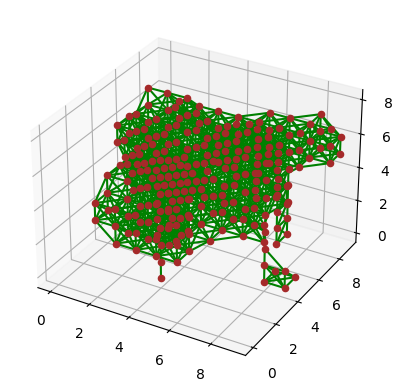

CPU times: user 4.74 s, sys: 201 ms, total: 4.94 s
Wall time: 4.69 s


In [66]:
%%time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Отрисовываем 3D облако точек и граф
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for i in range(voxel_len):
    ax.scatter(voxel_cloud.voxels[i][0], voxel_cloud.voxels[i][1], voxel_cloud.voxels[i][2], c='brown')
    
for edge in G.edges():
    ax.plot([voxel_cloud.voxels[edge[0]][0], voxel_cloud.voxels[edge[1]][0]],
            [voxel_cloud.voxels[edge[0]][1], voxel_cloud.voxels[edge[1]][1]],
            [voxel_cloud.voxels[edge[0]][2], voxel_cloud.voxels[edge[1]][2]], c='g')
plt.show()

In [35]:
from community import community_louvain

comms = community_louvain.best_partition(G)

unique_coms = np.unique(list(comms.values()))

print(unique_coms)

[0 1 2 3 4 5 6]


In [36]:
from random import randint

cmap = []

for i in range(len(unique_coms)):
    cmap.append('#%06X' % randint(0, 0xFFFFFF))

node_cmap = [cmap[v] for _,v in comms.items()]

print(node_cmap)

['#981984', '#92AA75', '#92AA75', '#1B03BF', '#981984', '#BE7ED2', '#B1CA48', '#B1CA48', '#981984', '#981984', '#8F0800', '#981984', '#B1CA48', '#92AA75', '#92AA75', '#1B03BF', '#BE7ED2', '#1B03BF', '#8F0800', '#981984', '#8F0800', '#981984', '#1B03BF', '#34E233', '#1B03BF', '#34E233', '#1B03BF', '#34E233', '#981984', '#981984', '#1B03BF', '#8F0800', '#981984', '#BE7ED2', '#92AA75', '#1B03BF', '#8F0800', '#8F0800', '#B1CA48', '#B1CA48', '#981984', '#981984', '#8F0800', '#981984', '#B1CA48', '#981984', '#981984', '#92AA75', '#8F0800', '#981984', '#1B03BF', '#8F0800', '#1B03BF', '#B1CA48', '#92AA75', '#92AA75', '#8F0800', '#1B03BF', '#92AA75', '#B1CA48', '#B1CA48', '#8F0800', '#92AA75', '#B1CA48', '#34E233', '#1B03BF', '#B1CA48', '#B1CA48', '#8F0800', '#981984', '#B1CA48', '#B1CA48', '#981984', '#92AA75', '#1B03BF', '#1B03BF', '#981984', '#B1CA48', '#981984', '#34E233', '#B1CA48', '#981984', '#8F0800', '#92AA75', '#981984', '#B1CA48', '#1B03BF', '#92AA75', '#8F0800', '#B1CA48', '#92AA75'

In [38]:
def draw_voxel_plot_colors(grid, colors):
    x_arr = []
    y_arr = []
    z_arr = []
    for i in range(voxel_len):
        x_arr.append(voxel_cloud.points[i][0])
        y_arr.append(voxel_cloud.points[i][1])
        z_arr.append(voxel_cloud.points[i][2])
    fig = go.Figure(
        data=[
          go.Scatter3d(
              x=x_arr, y=y_arr, z=z_arr, 
              mode='markers',
              marker=dict(size=5, color=colors)
          )
        ],
        layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
        )
        )
    return fig

draw_voxel_plot_colors(voxel_points, node_cmap)

In [39]:
from networkx.algorithms.community.modularity_max import greedy_modularity_communities

# Выполняем кластеризацию на основе модулярности
communities = greedy_modularity_communities(G)

# # Отображаем кластеры
# for i, c in enumerate(communities):
#     print(f"Cluster {i+1}: {c}")

In [40]:
# Создаем словарь цветов для кластеров
cmap = []
node_cmap = {}
    
for i, c in enumerate(communities):
    cmap.append('#%06X' % randint(0, 0xFFFFFF))
    for node in c:
        node_cmap[node] = cmap[i]

print(cmap)

draw_voxel_plot_colors(voxel_points, list(node_cmap.values()))
# # Отрисовываем 3D облако точек и граф
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# for i in range(voxel_len):
#     ax.scatter(voxel_points[i][0], voxel_points[i][1], voxel_points[i][2], c=node_cmap[i])
    
# # for edge in G.edges():
# #     ax.plot([voxel_points[edge[0]][0], voxel_points[edge[1]][0]],
# #             [voxel_points[edge[0]][1], voxel_points[edge[1]][1]],
# #             [voxel_points[edge[0]][2], voxel_points[edge[1]][2]], c='black')
# plt.show()

['#3888F8', '#F28C54', '#2D4CB4', '#2F3F0E', '#9E5DC6']


In [41]:
from sklearn.cluster import KMeans

# Вычисляем матрицу Лапласа графа
L = nx.laplacian_matrix(G).todense()

# Вычисляем собственные векторы матрицы Лапласа
eig_vals, eig_vecs = np.linalg.eig(L)

# Используем KMeans для кластеризации собственных векторов
kmeans = KMeans(n_clusters=4)
kmeans.fit(eig_vecs[:, :3])

# Создаем словарь цветов для кластеров
cmap = []
for i in range(n_clusters):
    cmap.append('#%06X' % randint(0, 0xFFFFFF))

node_cmap = []
for k in kmeans.labels_:
    node_cmap.append(cmap[k])

print(cmap)

draw_voxel_plot_colors(voxel_points, node_cmap)

['#4932FF', '#13E3BD', '#407763', '#6AE1EE']


In [42]:
from sklearn.cluster import SpectralClustering

# Создаем матрицу смежности
adj_matrix = nx.to_numpy_array(G)

# Выполняем спектральную кластеризацию
sc = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=1)
labels = sc.fit_predict(adj_matrix)

node_cmap = []
for k in labels:
    node_cmap.append(cmap[k])

print(cmap)

draw_voxel_plot_colors(voxel_points, node_cmap)

['#4932FF', '#13E3BD', '#407763', '#6AE1EE']


In [43]:
# print(list(G[1])) # соседи 1 вершины

# FG = nx.Graph()
# FG.add_weighted_edges_from([(1, 2, 0.125), (1, 3, 0.75), (2, 4, 1.2), (3, 4, 0.375)])
# for (u, v, wt) in FG.edges.data('weight'):
#     if wt < 0.5:
#         print(f"({u}, {v}, {wt:.3})")

# Начало

In [67]:
labels_dict = {} # словарь меток (цветов) для сохранения результатов
for node in range(G.number_of_nodes()):
    labels_dict[node] = -1
print(labels_dict)

{0: -1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: -1, 8: -1, 9: -1, 10: -1, 11: -1, 12: -1, 13: -1, 14: -1, 15: -1, 16: -1, 17: -1, 18: -1, 19: -1, 20: -1, 21: -1, 22: -1, 23: -1, 24: -1, 25: -1, 26: -1, 27: -1, 28: -1, 29: -1, 30: -1, 31: -1, 32: -1, 33: -1, 34: -1, 35: -1, 36: -1, 37: -1, 38: -1, 39: -1, 40: -1, 41: -1, 42: -1, 43: -1, 44: -1, 45: -1, 46: -1, 47: -1, 48: -1, 49: -1, 50: -1, 51: -1, 52: -1, 53: -1, 54: -1, 55: -1, 56: -1, 57: -1, 58: -1, 59: -1, 60: -1, 61: -1, 62: -1, 63: -1, 64: -1, 65: -1, 66: -1, 67: -1, 68: -1, 69: -1, 70: -1, 71: -1, 72: -1, 73: -1, 74: -1, 75: -1, 76: -1, 77: -1, 78: -1, 79: -1, 80: -1, 81: -1, 82: -1, 83: -1, 84: -1, 85: -1, 86: -1, 87: -1, 88: -1, 89: -1, 90: -1, 91: -1, 92: -1, 93: -1, 94: -1, 95: -1, 96: -1, 97: -1, 98: -1, 99: -1, 100: -1, 101: -1, 102: -1, 103: -1, 104: -1, 105: -1, 106: -1, 107: -1, 108: -1, 109: -1, 110: -1, 111: -1, 112: -1, 113: -1, 114: -1, 115: -1, 116: -1, 117: -1, 118: -1, 119: -1, 120: -1, 121: -1, 122: -1, 12

In [68]:
not_checked = set(G.nodes) # непроверенные узлы, изначально здесь все
in_progress = set()              # проверяемые в текущий момент
last_checked = set()             # проверенные на прошлом шаге
done_checked = set()
print(not_checked)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [69]:
%%time
# Шаг 1: найти точки заземления, посчитать количество кластеров
roots = set()
for i in range(voxel_len):
    if(voxel_cloud.voxels[i][2]==0):
        roots.add(i)

last_checked = set(roots)
n_trees = 0 # счетчик сегментов

for i in range(1, len(roots)+1):
    if len(roots) == 0:
        break
    n_trees += 1
    print(i, roots)
    node = roots.pop()
    labels_dict[node] = i
    neighbors = list(G.adj[node])
    for neib in neighbors:
        if neib in roots:
            labels_dict[neib] = i
            roots.discard(neib)
    
print('Количество деревьев: ', n_trees)

1 {33, 4, 231, 74, 75, 238, 179, 117, 22, 55, 26}
2 {4, 231, 74, 75, 22, 55, 26}
3 {231, 74, 75, 22, 55, 26}
4 {74, 75, 22, 26}
Количество деревьев:  4
CPU times: user 753 µs, sys: 456 µs, total: 1.21 ms
Wall time: 841 µs


In [70]:
%%time
def most_common(lst):
    return max(set(lst), key=lst.count)

while(len(not_checked) > 0):
#     print('DONE: ', done_checked)
#     print(last_checked)
    for node in last_checked: # набор обрабатываемых узлов из соседей узлов с предыдущего шага
        for new_node in list(G.adj[node]):
            if new_node not in (done_checked or last_checked):
                in_progress.add(new_node)
                neighbors_labels = []
                for new_nei in list(G.adj[new_node]):
                    if labels_dict[new_nei] != -1:
                        neighbors_labels.append(labels_dict[new_nei])
                labels_dict[new_node] = most_common(neighbors_labels)
            not_checked.discard(new_node)
        done_checked.add(node)
#     print('PROGRESS: ', in_progress)
    last_checked = in_progress
    in_progress = set()

CPU times: user 15.9 ms, sys: 624 µs, total: 16.5 ms
Wall time: 17.2 ms


In [71]:
print(list(labels_dict.values()))

[2, 3, 3, 4, 2, 1, 1, 1, 2, 2, 4, 2, 1, 3, 3, 4, 1, 4, 4, 2, 4, 2, 4, 4, 4, 4, 4, 4, 2, 2, 4, 4, 2, 1, 3, 4, 4, 4, 1, 1, 2, 2, 4, 2, 1, 2, 2, 3, 4, 2, 4, 4, 4, 1, 3, 3, 4, 4, 3, 1, 1, 4, 3, 1, 4, 4, 1, 1, 4, 2, 1, 1, 2, 3, 4, 4, 2, 1, 2, 2, 1, 2, 4, 3, 2, 1, 4, 3, 4, 1, 3, 4, 4, 3, 4, 4, 1, 4, 4, 2, 1, 4, 2, 4, 1, 3, 3, 1, 4, 3, 4, 4, 1, 4, 4, 3, 4, 1, 2, 4, 4, 1, 2, 1, 4, 4, 3, 3, 1, 4, 1, 2, 3, 4, 1, 4, 1, 1, 1, 2, 2, 4, 4, 2, 1, 2, 1, 3, 2, 1, 4, 2, 4, 4, 2, 2, 2, 1, 1, 3, 3, 4, 2, 2, 1, 3, 2, 3, 4, 2, 1, 1, 2, 2, 2, 1, 3, 4, 1, 1, 4, 4, 2, 2, 1, 2, 4, 4, 3, 3, 3, 4, 4, 2, 4, 4, 4, 4, 4, 2, 4, 1, 3, 4, 1, 3, 2, 1, 3, 4, 3, 2, 3, 4, 2, 1, 4, 1, 4, 2, 2, 2, 2, 1, 4, 2, 3, 1, 4, 2, 2, 3, 4, 2, 4, 1, 4, 4, 1, 4, 2, 1, 2, 4, 4, 4, 4, 1, 4, 2, 2, 1, 3, 1, 2, 2]


In [74]:
# Создаем словарь цветов для кластеров
cmap = []
for i in range(n_trees):
    cmap.append('#%06X' % randint(0, 0xFFFFFF))

node_cmap = []
for k in list(labels_dict.values()):
    node_cmap.append(cmap[k-1])

print(cmap)

#draw_voxel_plot_colors(voxel_points, node_cmap)
voxel_cloud.set_voxel_colors(node_cmap)
voxel_cloud.get_voxel_fig()

['#96768E', '#B9F04D', '#D6062F', '#20FE8F']


In [75]:
voxel_cloud.get_fig()